<a href="https://colab.research.google.com/github/Bashinim/Parking-Lot-Detection/blob/main/Detectron2/Berlin_DOP_2020_10_cm_Instance_Segmentation_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instance Segmentation with Berlin DOP, 10 cm resolution. The annotations are in COCO format


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 16kB/s 
     |████████████████████████████████| 6.6MB 379kB/s 
ERROR: torchtext 0.10.0 has requirement torch==1.9.0, but you'll have torch 1.5.0+cu101 which is incompatible.
  Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
     |████████████████████████████████| 276kB 13.6MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=dfebbaf03f46c8334504cb3682873414927639fabc2f82d66d0747b5d263423d
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML

In [ ]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.8)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#import torch
#assert torch.__version__.startswith("1.8")   # need to manually install torch 1.8 if Colab changes its default version
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 3.4MB/s 
     |████████████████████████████████| 51kB 5.7MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20210630-cp37-none-any.whl size=60611 sha256=996a6bb1c7e4135583b40033e21db65eea0004de4d87c0756a84b6ecf05b2323
  Stored in directory: /root/.cache/pip/wheels/b0/f7/36/05283055e1035eb8aedcdd7f816d46776979511769a2702908
Successfully built fvcore


## Get data

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

Importing data

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/Berlin DOP 2020 10cm/Train_annotations.json", "/content/drive/MyDrive/Berlin DOP 2020 10cm/Train")
register_coco_instances("my_dataset_valid", {}, "/content/drive/MyDrive/Berlin DOP 2020 10cm/Valid_annotations.json", "/content/drive/MyDrive/Berlin DOP 2020 10cm/Valid")
register_coco_instances("my_dataset_test", {}, "", "/content/drive/MyDrive/Berlin DOP 2020 10cm/Test")

## Register data-set

In order to use a dataset with Detectron2 we need to register it. For more information check out the official documentation.

[07/13 19:36:31 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Berlin DOP 2020 10cm/Train_annotations.json takes 1.34 seconds.
WARNING [07/13 19:36:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/13 19:36:31 d2.data.datasets.coco]: Loaded 128 images in COCO format from /content/drive/MyDrive/Berlin DOP 2020 10cm/Train_annotations.json


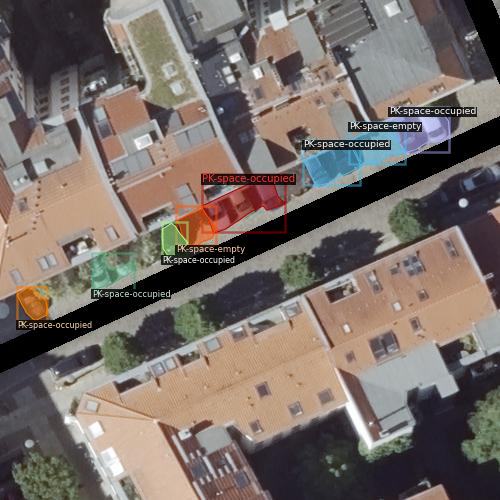

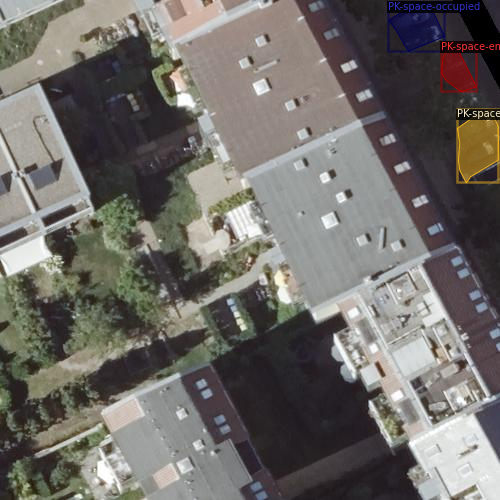

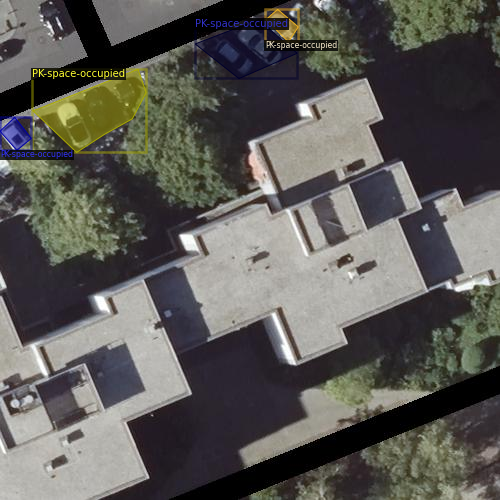

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train model

Now, let's fine-tune a pretrained FasterRCNN instance segmentation model on the microcontroller data-set.

In [ ]:
%%javascript
function ClickConnect(){
console.log("Working");
document.querySelector("colab-toolbar-button#connect").click()
}setInterval(ClickConnect,60000)

<IPython.core.display.Javascript object>

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 700
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()


[07/13 19:36:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:17, 10.2MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[07/13 19:37:01 d2.engine.train_loop]: Starting training from iteration 0
[07/13 19:37:10 d2.utils.events]:  eta: 0:04:43  iter: 19  total_loss: 2.596  loss_cls: 1.476  loss_box_reg: 0.146  loss_mask: 0.691  loss_rpn_cls: 0.214  loss_rpn_loc: 0.038  time: 0.4045  data_time: 0.3147  lr: 0.000050  max_mem: 2074M
[07/13 19:37:18 d2.utils.events]:  eta: 0:04:28  iter: 39  total_loss: 1.690  loss_cls: 0.671  loss_box_reg: 0.188  loss_mask: 0.664  loss_rpn_cls: 0.145  loss_rpn_loc: 0.033  time: 0.4072  data_time: 0.2897  lr: 0.000100  max_mem: 2074M
[07/13 19:37:26 d2.utils.events]:  eta: 0:04:10  iter: 59  total_loss: 1.316  loss_cls: 0.356  loss_box_reg: 0.253  loss_mask: 0.616  loss_rpn_cls: 0.098  loss_rpn_loc: 0.027  time: 0.3982  data_time: 0.2549  lr: 0.000150  max_mem: 2074M
[07/13 19:37:30 d2.utils.events]:  eta: 0:03:58  iter: 79  total_loss: 1.231  loss_cls: 0.290  loss_box_reg: 0.249  loss_mask: 0.552  loss_rpn_cls: 0.061  loss_rpn_loc: 0.027  time: 0.3492  data_time: 0.0572  lr:

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Use model for inference

Now, we can perform inference on our validation set by creating a predictor object.

In [ ]:
# DatasetCatalog.clear()
# MetadataCatalog.clear()

In [ ]:
# Evaluation
test_metadata = MetadataCatalog.get("my_dataset_valid")
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
cfg.DATASETS.TEST = ("my_dataset_valid", )
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_valid", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_valid")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/13 19:39:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/13 19:39:24 d2.data.datasets.coco]: Loaded 53 images in COCO format from /content/drive/MyDrive/Berlin DOP 2020 10cm/Valid_annotations.json
[07/13 19:39:24 d2.data.build]: Distribution of instances among all 2 categories:
|   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|
| PK-space-em.. | 66           | PK-space-oc.. | 152          |
|               |              |               |              |
|     total     | 218          |               |              |
[07/13 19:39:24 d2.data.common]: Serializing 53 elements to byte tensors and concatenating them all ...
[07/13 19:39:24 d2.data.common]: Serialized dataset takes 0.05 MiB
[07/13 19:39:24 d2.evaluation.evaluator]: Start inference on 53 images
[07/13 19:39:31 d2.evaluation.evaluator]: Inference done 11/53. 0.0406 s /

OrderedDict([('bbox',
              {'AP': 14.731840002669196,
               'AP-PK-space-empty': 9.173877631195914,
               'AP-PK-space-occupied': 20.289802374142482,
               'AP50': 32.59773344452753,
               'AP75': 12.169930001198221,
               'APl': 31.429552272846234,
               'APm': 14.869035774999231,
               'APs': 17.992534045780918}),
             ('segm',
              {'AP': 13.171058077342703,
               'AP-PK-space-empty': 8.510866827229622,
               'AP-PK-space-occupied': 17.831249327455787,
               'AP50': 29.80111367502658,
               'AP75': 11.460573661977477,
               'APl': 43.76657665766576,
               'APm': 16.41352268587376,
               'APs': 8.033993432196626})])

In [ ]:
# Printing the names of the categories
for i, name in enumerate(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes):
    print(i, name)

0 PK-space-empty
1 PK-space-occupied


In [ ]:
# from detectron2.utils.visualizer import ColorMode
from skimage.measure import find_contours, approximate_polygon, subdivide_polygon
import glob
import json
import numpy as np
from pycocotools import mask
from skimage import measure
import base64
import cv2

# Saving the predictions in lebelme format

In [ ]:

for imageName in glob.glob('/content/drive/MyDrive/Berlin DOP 2020 10cm/Test/*.jpeg'):
  
#for d in dataset_dicts:
  im = cv2.imread(imageName)
  outputs = predictor(im)
  masks = outputs['instances'].pred_masks.cpu().numpy()
  categories = outputs['instances'].pred_classes.cpu().numpy()
  encoded = base64.b64encode(open(imageName, "rb").read())
  number_of_masks = masks.shape[0]
  file_name_1 = imageName.replace("/content/drive/MyDrive/Berlin DOP 2020 10cm/Test/","")
  file_name_2 = file_name_1.replace(".jpeg","")
  file_name_3 = file_name_2 + ".json"
  file_name_4 = str("/content/drive/MyDrive/Berlin DOP 2020 10cm/Test/") + str(file_name_3)
  #print(file_name_1, file_name_2, file_name_3, file_name_4)
  main_annotation = {}
  main_annotation['shapes'] = []


  # Iterating for all masks. Every mask has one contour and a category relevant for that
  for x in range(0, number_of_masks):
    # Selecting relevant mask. Number of masks == number of categories
    ground_truth_binary_mask = masks[x,:,:]
    category = categories[x]
    if category == 0:
      cat = "PK-space-empty"
    else:
      cat = "PK-space-occupied"
    #fortran_ground_truth_binary_mask = np.asfortranarray(ground_truth_binary_mask)
    #contours = measure.approximate_polygon(ground_truth_binary_mask, 0.5)
    contours = measure.find_contours(ground_truth_binary_mask, 0.5)
    app_con = measure.approximate_polygon(np.array(contours[0]), tolerance=0.8)

    annotation = {
          "label" : cat,
          #"points": np.flip(contours[0], axis=1).tolist(),
          "points": np.flip(app_con, axis=1).tolist(),
          "group_id": None,
          "shape_type": "polygon",
          "flags": {}}

    main_annotation['shapes'].append(annotation)

  main_annotation["imagePath"] = file_name_1
  main_annotation["imageData"] = str(encoded)[2:-1]
  main_annotation["imageHeight"] = 512
  main_annotation["imageWidth"] = 512
  #print(main_annotation)
  # print(json.dumps(annotation, indent=4,  separators=(',', ':',)))
  with open(file_name_4, 'w') as file:
    json.dump(main_annotation, file,indent=4,  separators=(',', ':',))

  # v = Visualizer(im[:, :, ::-1],
  #                 metadata=test_metadata, 
  #                 scale=1, 
  #                 #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
  # )
  # v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  # cv2_imshow(v.get_image()[:, :, ::-1])

  # f = open("/content/drive/MyDrive/Cowc for detectrone2 test/COWC_PKLot_Predictions.txt","a")
  # f.write(str(d["file_name"]) +"\n" + str(outputs["instances"])+"\n")
  # f.close()
  # break
  # break

# Visualising the predictions

In [ ]:
#DatasetCatalog.clear()
#MetadataCatalog.clear()

In [ ]:
register_coco_instances("my_dataset_test2", {}, "/content/drive/MyDrive/Berlin DOP 2020 10cm/Test_annotations.json", "/content/drive/MyDrive/Berlin DOP 2020 10cm/Test")

[07/13 19:48:39 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Berlin DOP 2020 10cm/Test_annotations.json takes 1.13 seconds.
WARNING [07/13 19:48:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/13 19:48:39 d2.data.datasets.coco]: Loaded 468 images in COCO format from /content/drive/MyDrive/Berlin DOP 2020 10cm/Test_annotations.json


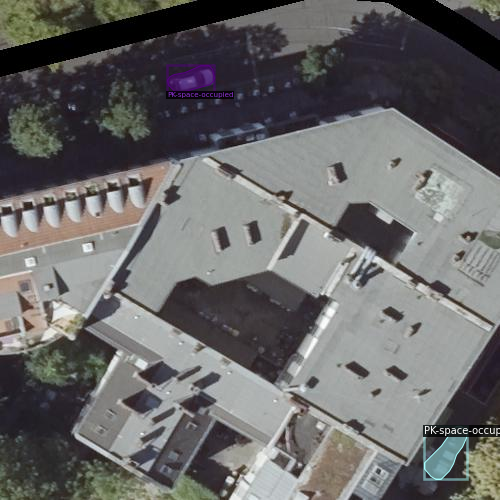

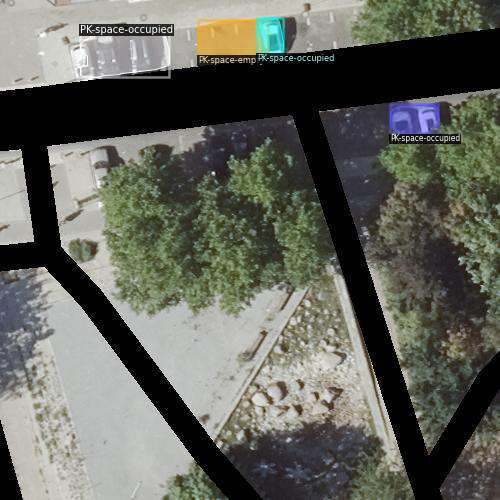

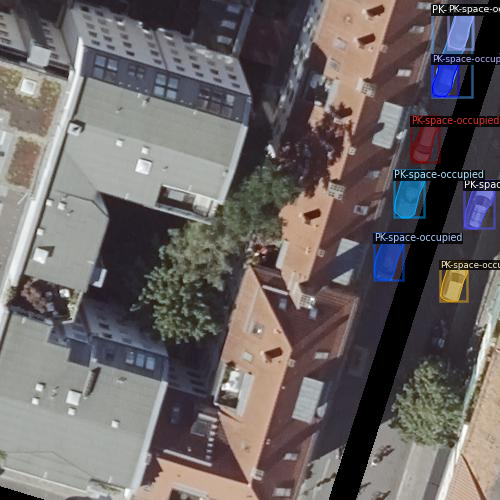

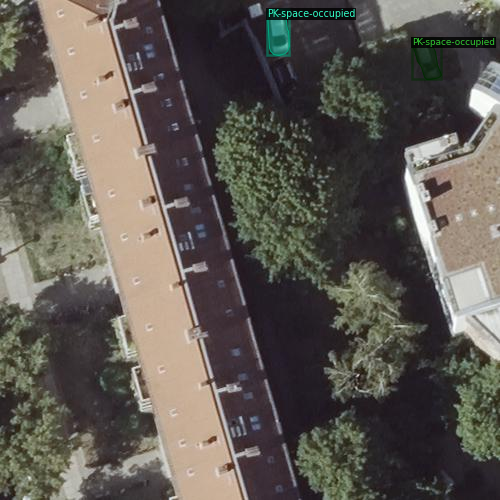

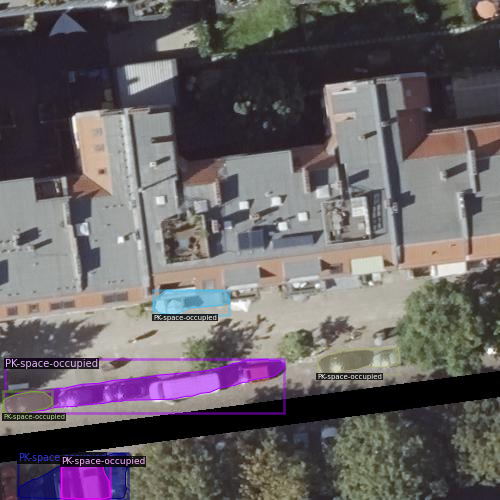

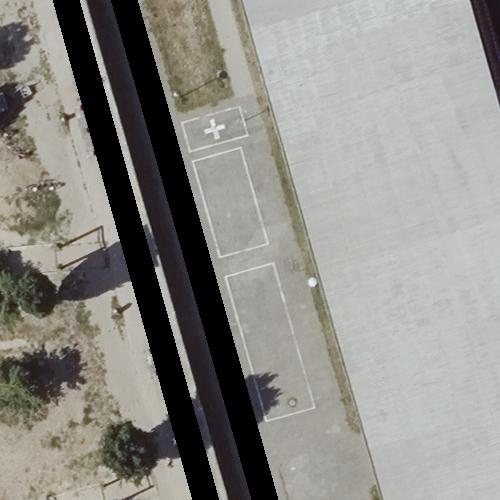

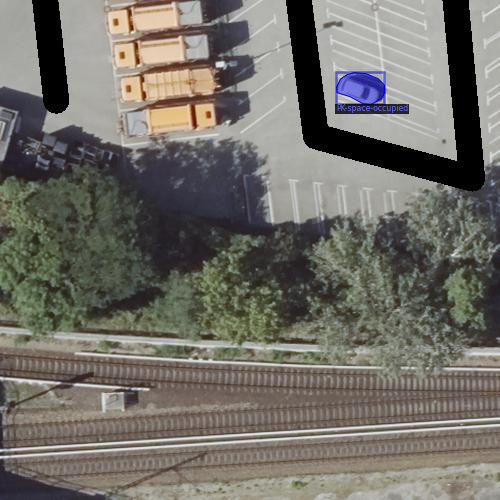

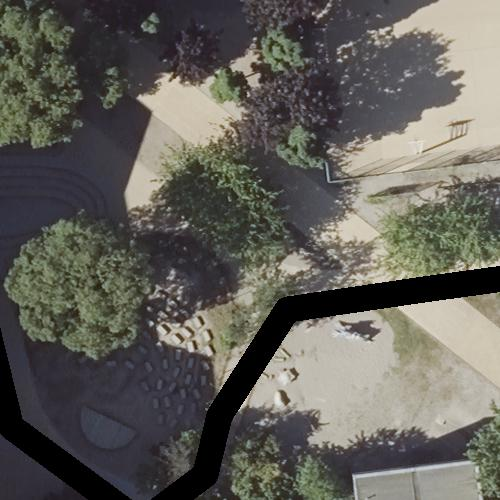

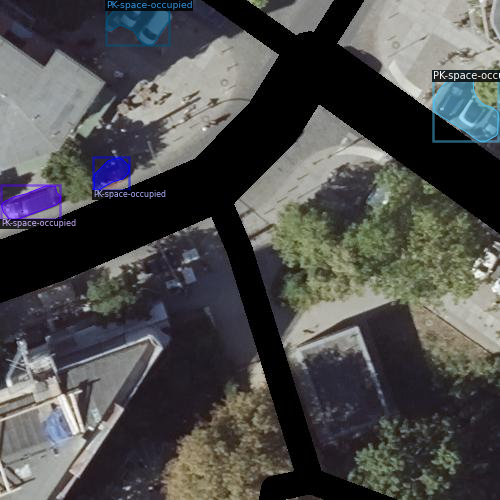

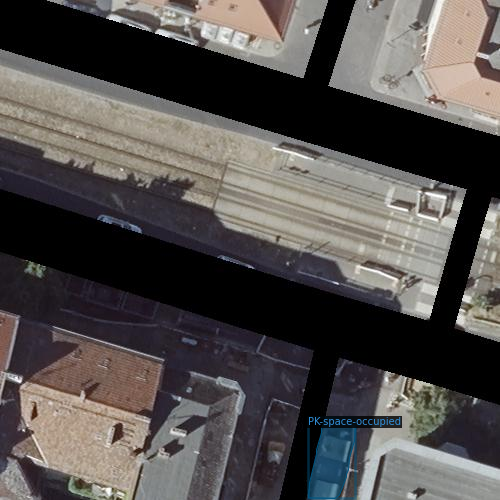

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_test2")
dataset_dicts = DatasetCatalog.get("my_dataset_test2")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])